## **Tarea 1: Vocoder LPC**
### EL7022 Procesamiento de Voz en Telecomunicaciones
#### Integrantes : 
 - Vincko Fabres
 - Martín Moreno
 
#### Profesor : Néstor Becerra Y.
#### Profesor Auxiliar : Nicolas Grageda U.
#### Ayudantes : 
 - Catalina Murua F.
 - Jorge Wuth S.

# **Introducción**

La voz es generada por fuentes sonoras del tracto vocal, donde mediante el paso de aire se genera una excitación, provocando resonancias de cuerdas vocales las que dan paso a diferentes fonemas. Con esta motivación nacen los vocoders, los que corresponden a analizadores y sintetizadores de voz orientados a la telecomunicación, los cuales mediante el análisis de las frecuencias fundamentales y los respectivos formantes utilizados en el habla representan la señal entregada para su posterior síntesis. La implementación de la técnica anteriormente mencionada disminuye el ancho de banda necesario para reconocer la voz, reduciendo la información a transmitir en comparación a la transmisión de información cruda.

Dado lo anterior, esta experiencia busca la implementación de un Vocoder LPC ,es decir, la implementación de un filtro IIR autoregresivo, para la codificación y decodificación de una señal correspondiente a la lectura de un texto, es decir, una señal que varía a lo largo del tiempo. La implementación a aplicar tiene de base la continuidad en frecuencia que se presenta al hablar, por lo que no deben existir discontinuidades y, por otra parte, el rango de frecuencias de una persona posee un rango acotado en el habla.

# **Manipulación de la señal**


A lo largo de esta sección se verá tratamiento de la señal, correspondiente a un audio grabado, el que corresponde a la lectura de un extracto del diálogo de la película ''Shrek''. La señal está muestreada a una frecuencia de muestreo de 8kHz y ya se cortó anteriormente a los extremos, para que no haya ningun comportamiento extraño al principio ni al final de la señal.

En un primer lugar, se hace import a las librerías que se ocuparán a lo largo de este documento/código, correspondiente a numpy para las operaciones matemáticas, vectores y matrices; matplotlib para los gráficos múltiples; scipy para la la manipulación de un audio externo; google.colab para la subida de archivos; Ipython para escuchar audios dentro del archivo; y finalmente plotly.express para el gráfico interactivo.

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt
from scipy.io.wavfile import write
from scipy.io.wavfile import read
from google.colab import files
from scipy import signal
import IPython
import plotly.express as px

Código [3] corresponde a la subida del archivo, que se tendrá que cargar cada vez que se runnea todo el código. Se tiene que seleccionar el archivo "A.wav" adjuntado.

In [ ]:
from google.colab import drive
#drive.mount('/content/drive/')

files.upload()

Luego, se procede a leer el archivo subido, el cual viene como una lista, la primera componente corresponde al valor de la frecuencia de muestreo, mientras que *v* corresponde a las muestras del audio. Notar que debido a que el audio es de 15 s, habrán 120.000 muestras en este vector.

Finalmente, se normaliza y se procede a reporducir el audio.

In [ ]:
#a = read("/content/drive/MyDrive/EL7022/A.wav")
a = read("pinpon_15s.wav")
#a = read("audio.wav")
fs = a[0]
Ts = 1/fs
v = a[1]
time = len(v)/fs
t = np.arange(0, time, Ts)


v=v/max(abs(v))
IPython.display.Audio(v, rate=fs)

A continuación se muestra el comportamiento de la señal en el dominio temporal, con un gráfico interactivo.

In [ ]:
fig = px.line(x=t, y=v)
fig.update_layout(
    title="Señal de voz original",
    xaxis_title="Tiempo [s]",
    yaxis_title="Amplitud")

fig.show()

  Para estimar T en la primera entrega, se hizo de forma manual, lo cual dio un T = 0.0097 s, lo que implica una frecuencia de voz de 103 Hz

Luego, se procede a separar la señal en ventanas de 25 ms, lo que corresponde a la señal completa en 600 ventanas, con 200 muestras cada ventana. Si la última ventana no tiene 200 muestras, se le añaden con 0's.

In [ ]:
#Tomaremos ventanas de 25 ms = 0.025 s

if len(v)%(fs*0.025) !=0:
  v = np.append(v, np.zeros(len(v)%(int(fs*0.025))))


tam_window = int(0.025 * fs)

windows = []

for i in np.arange(0, len(v), tam_window):
  windows = windows + [v[i:i+tam_window]]

Se le resta el componente DC a la señal, con la finalidad de quitarlo de esta para un mejor procesamiento.

In [ ]:
componente_DC = np.array([])
for i in range(len(windows)):
  componente_DC = np.append(componente_DC,(np.mean(windows[i])))
print(f'El componente DC promedio por ventana es : {np.mean(componente_DC)} +/- {np.std(componente_DC)}')


for i in np.arange(len(windows)):
  for j in np.arange(len(windows[i])):
    windows[i][j]=windows[i][j]-componente_DC[i]

El componente DC promedio por ventana es : -3.664658962179601e-05 +/- 0.0017055718743373548


# **Filtro LPC**

Para comenzar el procesamiento de la señal hacia un filtro LPC, en primer lugar se deberá definir la función correlación, la cual está dada por el código [9], el que replica la ecuación:

$R(i) = ∑_{n=i}^{N-1} x(n)x(n-i)$

Siendo *i* el número de la correlación, y *x* el vector al cual se desea sacar la correlación. En este caso el vector corresponde a cada una de las ventanas.

In [ ]:
# i = número
# x = ventana
def R(i, x):
  r=0
  N = len(x)
  i= abs(i)

  for n in range(i, N):
    r = r + x[n]*x[n-i]

  return r

Luego, ya teniendo la función de correlación, se procede a definir la función que obtiene los coeficientes LPC. Esta función recibe *win* que corresponde al vector que se desea obtener los coeficientes, y *p* que es la cantidad de coeficientes LPC. En primer lugar se sacan los valores de la correlación desde el 0 hasta el 12 (ambos inclusive), luego define la matriz y el vector de correlación, para luego despejar el vector A que contiene los coeficientes LPC. Esto se puede hacer sabiendo que se cumple la expresión *RA = r*.

In [ ]:
def coef_A(win, p):
  Rs = np.array([])
  for k in range(p+1):
    Rs=np.append(Rs, R(k, win))


  R_matriz = np.zeros((p, p)) 
  R_vector = np.zeros(p)
  for i in range(p):
    R_vector[i] = Rs[i+1]
    for k in range(p):
      R_matriz[i,k] = Rs[abs(i-k)]
  R_matriz_inv = np.linalg.inv(R_matriz)
  A = np.matmul(R_matriz_inv, R_vector)
  #para verificar
  #print(np.matmul(R_matriz, A))
  #print(R_vector)

  return A

Se calculan doce coeficientes LPC a  cada ventana de la señal. 

In [ ]:
p = 12    #cantidad de coef LPC

coef_LPC = []

for i in range(len(windows)):
  coef_LPC = coef_LPC + [coef_A(windows[i], p)]

print(coef_LPC[0])

[ 0.99652945 -0.21484343  0.06004041 -0.16359058  0.18407239 -0.07208866
  0.10128662 -0.08851146 -0.01423018 -0.08105647  0.08868583 -0.03486242]


A continuación, se procede a calcular la energía de cada ventana

In [ ]:
Energia = np.array([])
for i in range(len(windows)):
  Energia = np.append(Energia,(sum((windows[i])**2)))
print(f'La energia promedio por ventana es : {np.mean(Energia)} +/- {np.std(Energia)} [J]')
ventana = np.arange(0, len(Energia))


La energia promedio por ventana es : 0.8593109673870287 +/- 2.0049065439737763 [J]


# **Cálculo T0**

Para calcular T0 se necesitará definir un delta, que corresponderá la diferencia (para una ventana voice) entre el primer valor de la autocorrelación de una ventana y el comienzo del segundo ciclo del periodo de la autocorrelación de dicha ventana. Para esto, se necesitará comparar a mano varias ventanas en el tiempo con su respectiva autocorrelación. Así que se procede graficar cualquier ventana (en el audio usado en esta entrega, la ventana 455 es voice y la 0 es unvoice).

<function matplotlib.pyplot.show(*args, **kw)>

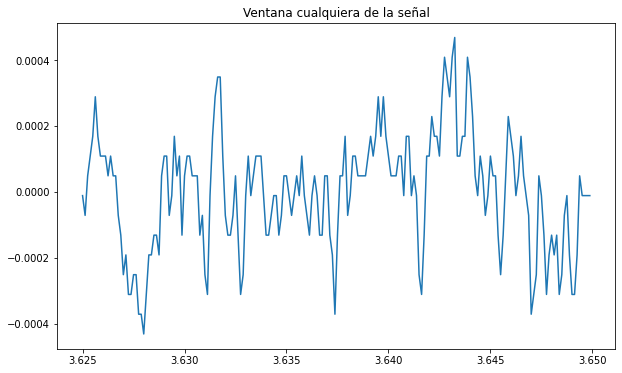

In [ ]:
I = 455   #0 unvoice y 455 voice

window_test = windows[I]
tw = np.arange(0,len(window_test)) 
tw = tw * 0.025/200 + 0.025*I

plt.figure(figsize=(10,6))
plt.plot(tw, window_test)
plt.title("Ventana cualquiera de la señal")
plt.show


Luego, se proceden a calcular las correlaciones de cada ventana, con *i = 0* hasta *i = 199* para cada ventana, debido a que habrá 200 muestras en cada ventana.

In [ ]:
R_windows = []
for k in range(0,len(windows)):
  R_win = np.array([])
  for i in np.arange(0, len(windows[k])):
    R_win = np.append(R_win, R(i, windows[k]))
  R_win = R_win/max(R_win)
  R_windows = R_windows + [R_win]

Luego, graficando la misma ventana que dos celdas atrás, se procecde graficar la autocorrelación en función de i, para así manualmente proceder a obtener el delta. En este caso, con un delta igual a 0.6 funciona bien la señal reconstruida.

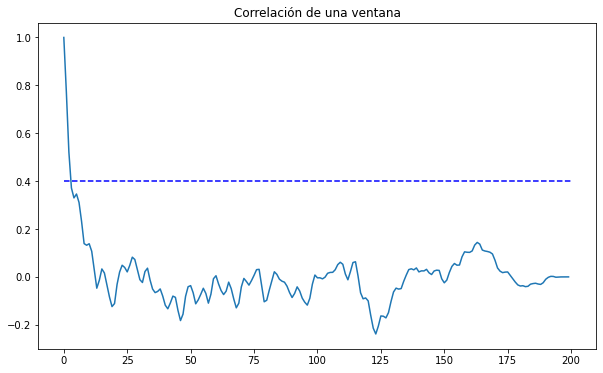

In [ ]:
delta = 1 - 0.4    #con 1-0.45 se escucha bien

plt.figure(figsize=(10,6))
plt.plot(np.arange(0, len(R_windows[I])), R_windows[I])
plt.hlines(y=1-delta, xmin= 0, xmax= 200, color='b',ls='--')
plt.title("Correlación de una ventana")
plt.show()

Luego, para el cálculo de T0, se procede a crear un array que contenga todos los T0 de cada ventana, y se verá la correlación de cada ventana entre la correlación con *i = 50* y *i = 100*, lo que implica que T0 estará entre *0.00625 s* y *'0.0125 s*, es decir, F0 estará entre *80 Hz* y *160 Hz*. Recordar que F0 en la entrega anterior era de *103 Hz*.

Esta función ve el máximo entre los valores anteriormente mencionados (debido que a la correlación en 0 es máxima, por ente, cuando empiece otro ciclo también será máximo). Si este máximo es mayor a 0.4, se clasifica como voice, sino, se clasifica como unvoice.

Mencionar que el cada ventana de correlación está normalizada.

In [ ]:
T0 = np.array([])

for i in np.arange(0, len(R_windows)):
  R_t = R_windows[i]
  R_t = R_t[50:100]        # T0 está entre 0.00625 y 0.0125    #80 Hz a 160 Hz
  maxR = np.max(R_t)
  index_maxR = np.argmax(R_t)+ 50   #si cambian rango de frecuencias, este igual

  if  R_windows[i][0] - maxR <= delta:
    T0 = np.append(T0, index_maxR * Ts)
    if i == 0:
      print(R_windows[i][0], maxR)
  else:
    T0 = np.append(T0, 0)

frame = np.arange(0, len(windows))

Posteriormente, se compara cada T0 con su vecindario, asignando voice a una ventana unvoice cuando su frame anterior y siguiente corresponde a voice (se le asigna el promedio de ambos). De igual manera, se cambia a unvoice cuando un frame voice tiene su ventana anterior y ventana siguiente como unvoice.

In [ ]:
for i in range(1, len(T0)-1):
  if T0[i] != 0:
    if T0[i-1] == 0 and T0[i+1] == 0:
      T0[i] = 0
  else:
    if T0[i-1] != 0 and T0[i+1] != 0:
      T0[i] = (T0[i-1] + T0[i+1]) / 2 

Luego de lo anterior, se procede a suavizar aún más el periodo por frame, haciendo que, cuando un T0 se escapa de un valor superior a 0.0034 con respecto a sus dos vecinos, o inferior a 0.0034 con respecto a sus dos vecimos, se transforma en el promedio de sus vecinos.

A continuación, se muestra un gráfico interactivo que muestra el T0 resultante por frame.

In [ ]:
delta2 = 0.0034

for i in range(1, len(T0)-1):
  if T0[i] != 0:
    if T0[i-1] != 0 and T0[i+1] != 0:
      if (T0[i-1] - T0[i] >= delta2) and (T0[i+1] - T0[i] >= delta2) or (T0[i-1] - T0[i] <= delta2) and (T0[i+1] - T0[i] <= delta2):
        T0[i] = (T0[i-1] + T0[i+1]) / 2
        #print(f"cambio {i}")

fig = px.line(x=frame, y=T0)
fig.update_layout(
    title="Gráfico de t0 por frame",
    xaxis_title="Frame",
    yaxis_title="T0 [s]")

fig.show()   

Luego, se crea el tren de impulsos que corresponde a la exitación del filtro cuando la ventana es voice, y ruido cuando es unvoice, para luego separarlos por ventanas del mismo tamaño que las ventanas de la señal.

In [ ]:
impulsos = np.zeros(int(time*fs))
count = 0
ultimo_impulso = 0
while count<len(impulsos):
  ventana = int(count/tam_window)
  if T0[ventana] == 0:
    impulsos[count] = random.gauss(0, 0.2)
    ultimo_impulso = 0
  else:
    if int(fs*T0[ventana]) <= ultimo_impulso :
      impulsos[count] = 1
      ultimo_impulso = 0
  count+=1
  ultimo_impulso+=1



fig = px.line(x=t, y=impulsos)
fig.update_layout(
    title="Tren de impulsos",
    xaxis_title="Tiempo [s]",
    yaxis_title="Amplitud")
fig.show()

windows_imp = []

for i in np.arange(0, len(impulsos), tam_window):
  windows_imp = windows_imp + [impulsos[i:i+tam_window]]

Posteriormente, se procede a pasar cada ventana del tren de impulsos creada anteriormente por el filtro, teniendo una ganancia constante igual a uno. Esto se hace teniendo en cuenta la ecuación para filtro IIR. Y se normaliza la señal resultante.

In [ ]:
y = np.array([])

#Se filtra

for i in range(len(windows_imp)):
  x = windows_imp[i]
  a = coef_LPC[i]

  for n in range(len(x)):
    gain = 1
    y_n = gain * x[n]
    N = len(x)*i + n
    
    for L in range(len(a)):
      if (N-L-1) < 0:
        y_n = y_n + 0
      else:
        y_n = y_n + a[L]*y[N-L-1]
    y = np.append(y, y_n)

#Normalizar

y = y/max(y)




A continuación, se procede a separar esta señal resultante por ventanas, esto para calcular la energía por ventanas.

Después, se saca la energía por frame de cada ventana de la señal LPC. Y finalmente se normaliza ambas energías por frame en el gráfico por el máximo de la energía de la señal original y se grafica ambas energías por frame.

La energia promedio por ventana es : 2.023602846053136 +/- 3.7143044199163957 [J]


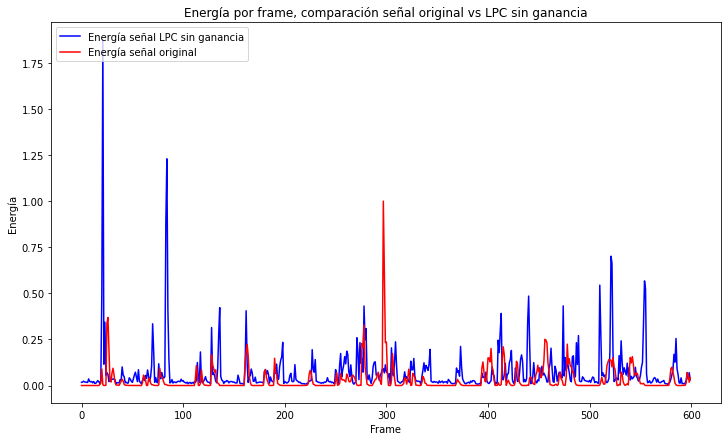

In [ ]:
#se separa la señal resultante por ventanas
windows_y = []

for i in np.arange(0, len(v), tam_window):
  windows_y = windows_y + [y[i:i+tam_window]]


#Energía por ventana de la señal LPC.
Energia_y = np.array([])
for i in range(len(windows_y)):
  Energia_y = np.append(Energia_y,(sum((windows_y[i])**2)))
print(f'La energia promedio por ventana es : {np.mean(Energia_y)} +/- {np.std(Energia_y)} [J]')
ventana_y = np.arange(0, len(Energia_y))

#Se normaliza la energía de la señal original y la energía de la señal LPC por el máximo de la señal original (ambas por el mismo valor).
maxE = max(Energia)


plt.figure(figsize=(12,7))
plt.plot(ventana_y, Energia_y/maxE, 'b', label = "Energía señal LPC sin ganancia")
plt.plot(ventana_y, Energia/maxE, 'r', label = "Energía señal original") 
plt.legend(loc = "upper left")
plt.title("Energía por frame, comparación señal original vs LPC sin ganancia")
plt.xlabel("Frame")
plt.ylabel("Energía")

plt.show()

Luego, se saca la ganancia de cada ventana utilizando la siguiente fórmula:

$G_{i} = \sqrt{\frac{E_{original_{i}}}{E_{LPC_{i}}}} $

Notar que, no normalizando las energías dará el mismo resultado de ganancias, debido a que se normalizó con respecto a mismo valor, y también como es una división, se cancelará la constante de normalización.

En la última línea de la celda [47], se cambia el signo de la ganancia, esto es porque la señal decodificada está invertida en comparación a la señal original.


In [ ]:
Gain = np.array([])
for i in np.arange(0, len(Energia_y)):
  Gain = np.append(Gain, np.sqrt(Energia[i]/Energia_y[i]) )


y_Gain = np.array([])
for i in np.arange(0, len(y)):
  y_Gain = np.append(y_Gain, Gain[int(i/tam_window)]* y[i])

y_Gain = -y_Gain

Finalmente, se aplica la ganancia en cada ventana de la señal decodificada, y se plotea nuevamente la ganancia por ventana de la señal LPC con ganancia, comparándola con la energía de la señal original.

La energia promedio por ventana es : 0.8593109673870287 +/- 2.0049065439737768 [J]


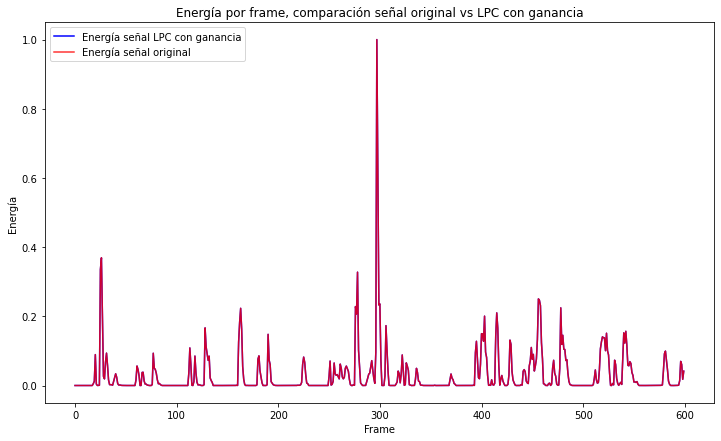

In [ ]:
windows_y_Gain = []

for i in np.arange(0, len(v), tam_window):
  windows_y_Gain = windows_y_Gain + [y_Gain[i:i+tam_window]]


Energia_y_Gain = np.array([])
for i in range(len(windows_y_Gain)):
  Energia_y_Gain = np.append(Energia_y_Gain,(sum(windows_y_Gain[i]**2)))
print(f'La energia promedio por ventana es : {np.mean(Energia_y_Gain)} +/- {np.std(Energia_y_Gain)} [J]')


plt.figure(figsize=(12,7))
plt.plot(ventana_y, Energia_y_Gain/maxE, 'b', label = "Energía señal LPC con ganancia")
plt.plot(ventana_y, Energia/maxE, 'r', alpha = 0.8, label = "Energía señal original") 
plt.title("Energía por frame, comparación señal original vs LPC con ganancia")
plt.xlabel("Frame")
plt.ylabel("Energía")
plt.legend(loc="upper left") 
plt.show()

Se guarda la señal y se grafica interactivamente la señal decodificada final, también se despliega un reproductor de audio para escuchar el sonido resultante.

In [ ]:
#Se guarda la señal
#write('/content/drive/MyDrive/EL7022/recreada_con_DC.wav', fs, y) 
write('recreada.wav', fs, y_Gain) 

fig = px.line(x=t, y=y_Gain)
fig.update_layout(
    title="Señal de voz recreada",
    xaxis_title="Tiempo [s]",
    yaxis_title="Amplitud")
fig.show()

IPython.display.Audio(y_Gain, rate=fs)

#**Para el doble de la frecuencia, es decir, más aguda**

Dada la implementación del filtro LPC, el cual modela el comportamiento de las cuerdas vocales, es posible variar el tren de impulsos asociado al filtro, con lo cual al agregar una mayor cantidad de impulsos para la misma cantidad de tiempo se aumenta la frecuencia de estos, lo que se traduce en la misma oración hablada con una frecuencia fundamental más aguda.

Para implementar el tren de impulsos agudo se agregan impulsos entre los ya existentes pertenecientes a las ventanas no mudas, con lo cual aumenta la frecuencia de estos.

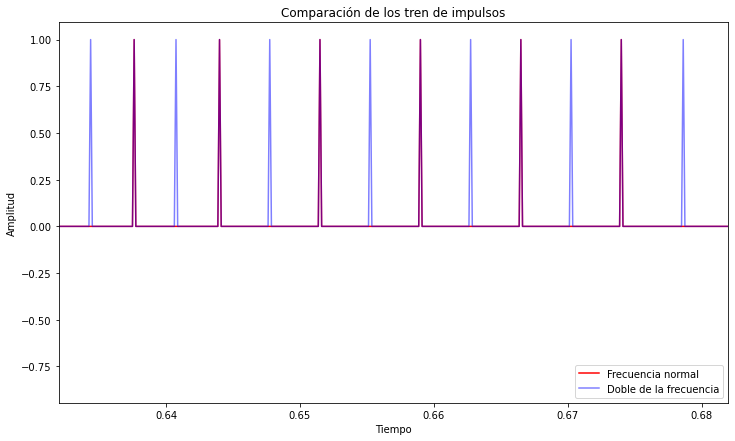

In [ ]:
impulsos_doble = impulsos.copy()
ultimo_uno = -1

for i in np.arange(len(impulsos_doble)):
  if (impulsos_doble[i] == 1) :
    if ultimo_uno == -1:
      ultimo_uno = i
    else:
      meter_imp = int((ultimo_uno+i)/2)
      if i-ultimo_uno<200:
        impulsos_doble[meter_imp] = 1
      ultimo_uno = i





plt.figure(figsize=(12,7))
plt.plot(t, impulsos,color='r',label='Frecuencia normal')
plt.plot(t, impulsos_doble,color='b',alpha=0.5,label='Doble de la frecuencia')
plt.title('Comparación de los tren de impulsos')
plt.ylabel('Amplitud')
plt.xlabel('Tiempo')
plt.legend(loc='lower right')
lim = 0.632
plt.xlim(lim, lim+0.05)
plt.show()

windows_imp_doble = []

for i in np.arange(0, len(impulsos_doble), tam_window):
  windows_imp_doble = windows_imp_doble + [impulsos_doble[i:i+tam_window]]

Posterior a la creación de los impulsos, se aplica la ganancia correspondiente para cada uno de estos y se procede análogamente al caso anterior.

In [ ]:
y_2f = np.array([])

#Se filtra

for i in range(len(windows_imp_doble)):
  x = windows_imp_doble[i]
  a = coef_LPC[i]

  for n in range(len(x)):
    gain = 1
    y_n = gain * x[n]
    N = len(x)*i + n
    
    for L in range(len(a)):
      if (N-L-1) < 0:
        y_n = y_n + 0
      else:
        y_n = y_n + a[L]*y_2f[N-L-1]
    y_2f = np.append(y_2f, y_n)

#Normalizar

y_2f = y_2f/max(y_2f)


windows_y_2f = []

for i in np.arange(0, len(v), tam_window):
  windows_y_2f = windows_y_2f + [y_2f[i:i+tam_window]]

#calculo de energia

Energia_y_2f = np.array([])
for i in range(len(windows_y_2f)):
  Energia_y_2f = np.append(Energia_y_2f,(sum((windows_y_2f[i])**2)))
ventana_y_2f = np.arange(0, len(Energia_y_2f))

#ganancia por ventana

Gain_2f = np.array([])
for i in np.arange(0, len(Energia_y_2f)):
  Gain_2f = np.append(Gain_2f, np.sqrt(Energia[i]/Energia_y_2f[i]) )


y_Gain_2f = np.array([])
for i in np.arange(0, len(y_2f)):
  y_Gain_2f = np.append(y_Gain_2f, Gain_2f[int(i/tam_window)]* y_2f[i])

y_Gain_2f = -y_Gain_2f


In [ ]:
fig = px.line(x=t, y=y_Gain_2f)
fig.update_layout(
    title="Señal de voz recreada",
    xaxis_title="Tiempo [s]",
    yaxis_title="Amplitud")
fig.show()

IPython.display.Audio(y_Gain_2f, rate=fs)

#**Para la mitad de la frecuencia, es decir, más grave**

Con la motivación anterior es posible crear el caso contrario, es decir, reproducir el audio con tonalidad más grave, para lo cual se debe aplicar la mitad de los impulsos de la señal decodificada original.

Para generar la mitad de los impulsos al tren de impulsos original se le descarta impulso por medio.

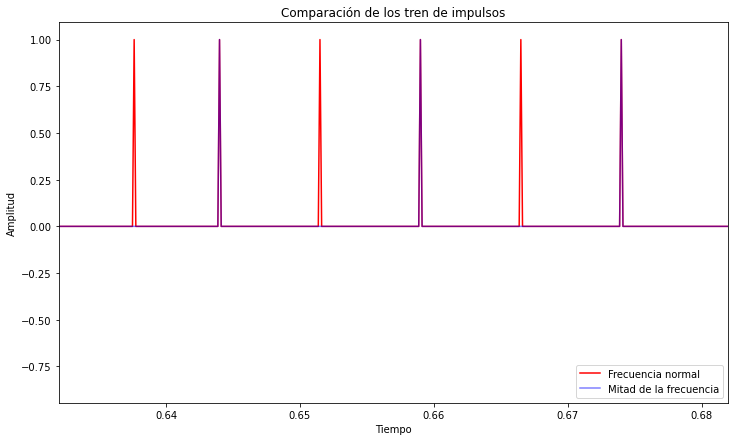

In [ ]:
impulsos_mitad = impulsos.copy()
ultimo_uno = -1

for i in np.arange(len(impulsos_mitad)):
  if (impulsos_mitad[i] == 1) :
    if ultimo_uno == -1:
      ultimo_uno = 1
    else:
      impulsos_mitad[i] = 0
      ultimo_uno = -1





plt.figure(figsize=(12,7))
plt.plot(t, impulsos,color='r',label='Frecuencia normal')
plt.plot(t, impulsos_mitad,color='b',alpha=0.5,label='Mitad de la frecuencia')
plt.title('Comparación de los tren de impulsos')
plt.ylabel('Amplitud')
plt.xlabel('Tiempo')
plt.legend(loc='lower right')
lim = 0.632
plt.xlim(lim, lim+0.05)
plt.show()

windows_imp_mitad = []

for i in np.arange(0, len(impulsos_mitad), tam_window):
  windows_imp_mitad = windows_imp_mitad + [impulsos_mitad[i:i+tam_window]]

Una vez generado el tren de impulsos se aplica de forma análoga el procedimiento aplicado para la primera y segunda decodificación.

In [ ]:
y_mf = np.array([])

#Se filtra

for i in range(len(windows_imp_mitad)):
  x = windows_imp_mitad[i]
  a = coef_LPC[i]

  for n in range(len(x)):
    gain = 1
    y_n = gain * x[n]
    N = len(x)*i + n
    
    for L in range(len(a)):
      if (N-L-1) < 0:
        y_n = y_n + 0
      else:
        y_n = y_n + a[L]*y_mf[N-L-1]
    y_mf = np.append(y_mf, y_n)

#Normalizar

y_mf = y_mf/max(y_mf)


windows_y_mf = []

for i in np.arange(0, len(v), tam_window):
  windows_y_mf = windows_y_mf + [y_mf[i:i+tam_window]]

#calculo de energia

Energia_y_mf = np.array([])
for i in range(len(windows_y_mf)):
  Energia_y_mf = np.append(Energia_y_mf,(sum((windows_y_mf[i])**2)))
ventana_y_mf = np.arange(0, len(Energia_y_mf))

#ganancia por ventana

Gain_mf = np.array([])
for i in np.arange(0, len(Energia_y_mf)):
  Gain_mf = np.append(Gain_mf, np.sqrt(Energia[i]/Energia_y_mf[i]) )


y_Gain_mf = np.array([])
for i in np.arange(0, len(y_mf)):
  y_Gain_mf = np.append(y_Gain_mf, Gain_mf[int(i/tam_window)]* y_mf[i])

y_Gain_mf = -y_Gain_mf


In [ ]:
fig = px.line(x=t, y=y_Gain_mf)
fig.update_layout(
    title="Señal de voz recreada",
    xaxis_title="Tiempo [s]",
    yaxis_title="Amplitud")
fig.show()

IPython.display.Audio(y_Gain_mf, rate=fs)

# **Resultados**

Se proceden a graficar las dos señales con un zoom entre 1.97s y 2.02s. Corresponde a la señal original y la señal LPC.

(-1.0, 1.0)

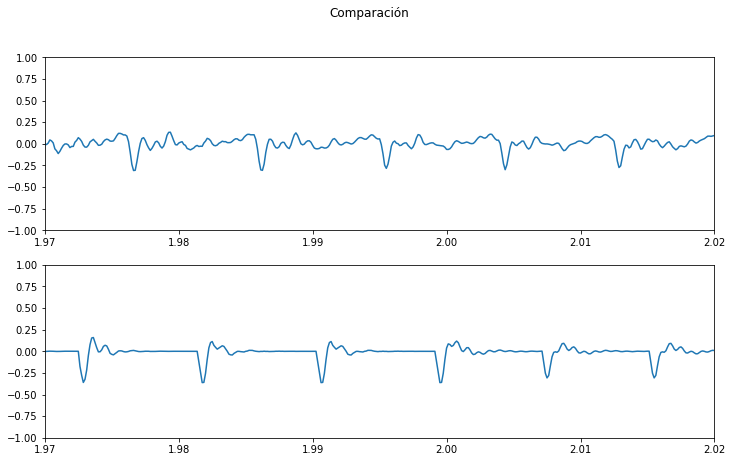

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(12,7))
fig.suptitle('Comparación')
ax1.plot(t, v)
ax1.set_xlim(1.97, 1.97+ 0.05)
ax1.set_ylim(-1,1)
ax2.plot(t, y_Gain)
ax2.set_xlim(1.97, 1.97+ 0.05)
ax2.set_ylim(-1,1)

In [ ]:
fourierTransform_original = np.fft.fft(v)/len(v)
fourierTransform_original = fourierTransform_original[range(int(len(v)/2))]
tpCount_o     = len(v)
values_o      = np.arange(int(tpCount_o/2))
timePeriod  = tpCount_o/fs
frequencies_o = values_o/timePeriod
#plt.plot(frequencies_o, abs(fourierTransform_original))

In [ ]:
fourierTransform_LPC = np.fft.fft(y_Gain)/len(y_Gain)
fourierTransform_LPC = fourierTransform_LPC[range(int(len(y_Gain)/2))]
tpCount_LPC     = len(y_Gain)
values_LPC      = np.arange(int(tpCount_LPC/2))
timePeriod_LPC  = tpCount_LPC/fs
frequencies_LPC = values_LPC/timePeriod_LPC

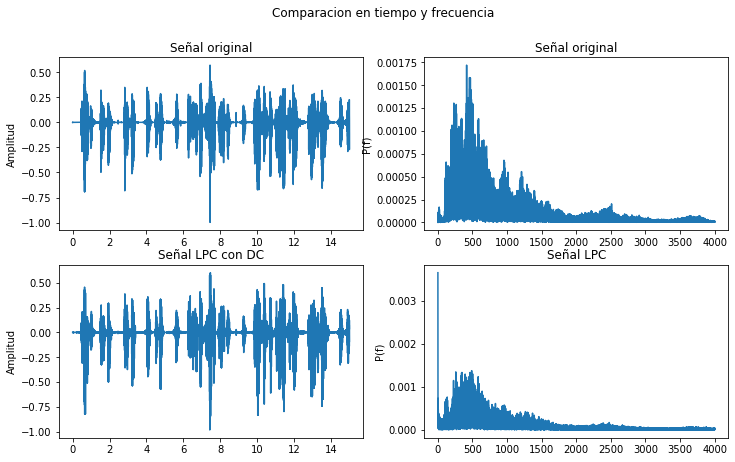

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(12,7))

axs[0, 0].plot(t, v)
axs[0, 0].set_title('Señal original')
axs[0, 0].set_ylabel('Amplitud')

axs[1, 0].plot(t, y_Gain)
axs[1, 0].set_title('Señal LPC con DC')
axs[1, 0].set_ylabel('Amplitud')
# axs[0, 0].set_xlabel('Tiempo')




axs[0, 1].plot(frequencies_o, abs(fourierTransform_original))
axs[0, 1].set_title('Señal original')
axs[0, 1].set_ylabel('P(f)')

axs[1, 1].plot(frequencies_LPC, abs(fourierTransform_LPC))
axs[1, 1].set_title('Señal LPC')
axs[1, 1].set_ylabel('P(f)')
# axs[0, 0].set_xlabel('Tiempo')


fig.suptitle('Comparacion en tiempo y frecuencia')
plt.show()

En el siguiente gráfico se puede apreciar las diferencias en un plano general y temporal que tienen ambas señales a lo lago del tiempo. Ambas señales poseen un comportamiento similar el dominio temporal.

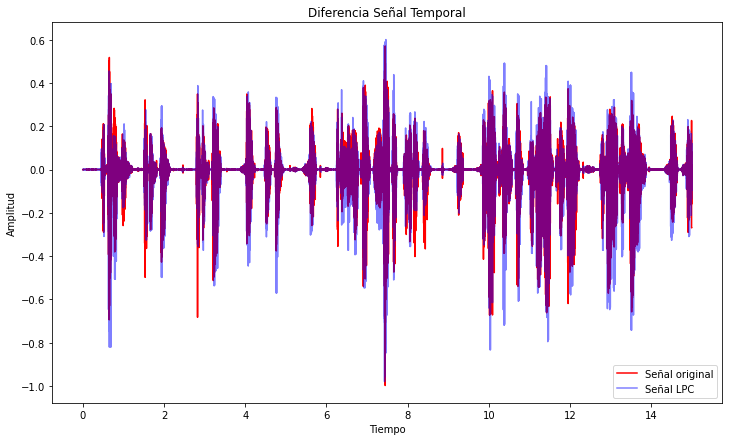

In [ ]:
plt.figure(figsize=(12,7))
plt.plot(t, v,color='r',label='Señal original')
plt.plot(t, y_Gain,color='b',alpha=0.5,label='Señal LPC')
plt.title('Diferencia Señal Temporal')
plt.ylabel('Amplitud')
plt.xlabel('Tiempo')
plt.legend(loc='lower right')
plt.show()


Por otra parte, en el dominio de la frecuencia tienen amplitudes semejantes en las frecuencias mostradas, sin embargo, la señal LPC tiene un componente de gran magnitud cuando la frecuencia es igual a 0, es decir, la componente DC.

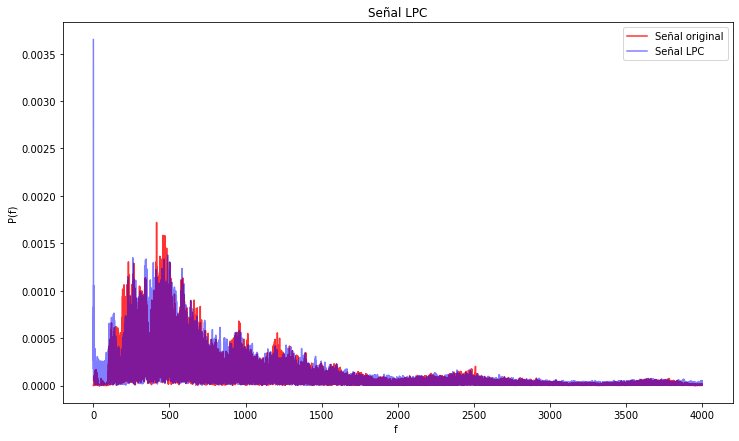

In [ ]:
plt.figure(figsize=(12,7))
plt.plot(frequencies_LPC, abs(fourierTransform_original),alpha=0.8,color='r',label='Señal original')
plt.plot(frequencies_LPC, abs(fourierTransform_LPC),alpha=0.5,color='b',label='Señal LPC')
plt.title('Señal LPC')
#plt.ylim(0,10**-3)
plt.ylabel('P(f)')
plt.xlabel('f ')
plt.legend(loc='upper right')
plt.show()


# **Conclusión**

A lo largo de esta tarea se trabajó sobre uno de los métodos auto-regresivos de la reconstrucción de una señal de voz, el método de análisis LPC, que tiene como objetivo tomar ventanas pequeñas de señales de voz, donde se consideran estacionarias, y obtener los coeficientes para un filtro, que serán los datos enviados. Visto lo anterior, en este caso se optó por tomar ventanas de 25 milisegundos a lo largo de una señal de 15 segundos, con una frecuencia de muestreo de 8kHz, donde está grabado un audio de voz que recita un a oración de una persona, la cual su frecuencia de voz se ubica entre los 80 Hz y 160 Hz. Se trabajó con 12 coeficientes LPC en cada ventana, obteniéndolos a partir del método Yule-Walker, y comparando el audio original y el audio reconstruido,donde se puede verificar que se entiende la señal reconstruida si se oye cualitativamente, donde se puede decir que las ventanas mal caracterizadas (de voice pasan a unvoice) se oyen como susurro debido al ruido blanco gaussiano que se inyecta.

En conclusión, se puede realizar una reconstrucción de una señal de voz que puede transmitir una cantidad considerable de información a partir de una cantidad menor de datos a enviar. Como lo es en este caso, donde cada ventana transmitió 12 datos de coeficientes LPC, un dato de energía para calcular la ganancia y un dato que contiene la frecuencia de muestreo, en vez de transmitir una señal completa de 200 muestras. Esto hace que el tiempo y memoria para transmitir la señal sea menor, haciendo de este método más eficiente, ya que contrastando para este caso; por ventana de 200 muestras se tiene 1 Byte por muestra, es decir 200 Bytes, mientras que con LPC se necesitan 12 valores o Bytes para los coeficientes del filtro, $f_{0}$, y ganacia por ventana, es decir, menos de 20 valores. Obteniendo una señal que aún conserva la información relevante para reconocer el mensaje.

En los resultados de las experiencias se puede notar como bajo un mismo filtro LPC se puede variar la frecuencia del hablante según la frecuencia del tren de impulsos para las partes sonoras, lo cual refleja como funciona la comunicación humana, cuerdas vocales versus paso de aire. Por otra parte, al analizar en frecuencias los resultados de decodificación LPC es posible notar componentes DC a pesar de su filtrado para la señal original, esto puede deberse a la implementación del tren de impulsos para señal sonora, ya que al ser todas amplitudes positivas, cada una podría aportar en frecuencia 0.

El código aplicado se puede mejorar de diferentes maneras, por ejemplo implementando una ventana de hamming en vez de una rectangular, lo que haría que parte de la información no se perdiera. También se puede seguir suavizando la ventana de T0, viendo vecinos más lejanos y prediciendo qué viene, y junto con esto, aumentar el rango de frecuencias a captar, para que sea más robusto y no enfocado a una persona. Y para terminar, se podrían obtener más coeficientes LPC para una mejor reconstrucción de esta señal.

Mencionar finalmente que, se aprendió a lo largo de este proyecto, a implementar uno de las tecnologías usadas en comunicaciones telefónicas, entendiendo de mejor manera todo lo visto en clases.


